# Calculating agricultural receipts from pumping information

In [1]:
import pandas as pd
import geopandas as gp
import yaml
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np

### we need to navigate to the base run to get well IDs and to the `econ` directory for some information needed to link it all up

In [2]:
base_run_path = Path("../pycap_runs/pycap_base")
econ_path = Path('../econ')

### first get the well IDs from the pycap yml configuration file

In [3]:
with open(base_run_path / "LPR_Redux.yml", 'r') as ifp:
        indat = yaml.safe_load(ifp)

In [4]:
# now we need to strip off just the numbers into a list
wells = [int(i.split('_')[1]) for i in list(indat.keys()) if i.startswith('well')]
wells[:5]

[418, 466, 467, 490, 509]

### we need to cross reference these IDs to align with the other datasets below. The IDs in the Yml file are hicap IDs - we need generic site numbers. This happens because numbers get scrambled to alias information and make it harder to link up individual peoples' property with water use and other information.

In [5]:
well_source_xref = pd.read_csv(econ_path / "source_hcw_xref.csv", index_col=1).dropna()
well_source_xref.index = [int(i) if not np.isnan(i) else 0 for i in well_source_xref.index]

In [6]:
# but this is a "crosswalk" between well ID (the index) and site_no (the column)
well_source_xref

,site_no
70433,3863
36699,3869
68338,3876
8,3878
316,3879
...,...
92606,26501
92645,26545
92653,26553
92719,26618


In [7]:
src_wells = [well_source_xref.loc[w, 'site_no'] 
             for w in wells
             if w in well_source_xref.index ]

In [8]:
len(src_wells), len(wells)

(231, 327)

### So the `src_wells` list above is the `site_no` values corresponding with the well_ids we have in our model. Note that, of the 327 wells in our `pycap` model, only 231 have corresponding information on parcels and crop rotations. That's due to the crop rotation and parcel information being a bit dated. We will just have to work with what we have, though.

### There are a number of crop rotations identified in the area. Let's check out a shapefile

In [9]:
crop_rotations = gp.read_file('../econ/parcel_rot.shp').dropna()

In [10]:
# there are 5 rotations defined
crop_rotations.rotation.unique()

array(['potato/veg', 'cash_grain', 'non-ag', 'pasture/hay', 'dairy'],
      dtype=object)

In [11]:
crop_rotations.explore(column='rotation')

### note that this covers a larger area - it's from a bigger project. But, now we have parcels identified with their crop rotations also identified. #nice So, we just need to sort out which wells supply which parcels. If only there were some kind of a lookup table........

In [12]:
source2parcel = pd.read_csv('../econ/source_parcel_xref.csv')
source2parcel

,parcel_id,site_no,parcel_to_source_pct,source_to_parcel_pct
0,42,10265,1.0,0.388693
1,57,10265,1.0,0.298587
2,61,10265,1.0,0.166078
3,69,10265,1.0,0.146643
4,92,5131,1.0,0.273927
...,...,...,...,...
26537,3549580,22599,1.0,0.355556
26538,3549581,22599,1.0,0.320000
26539,3550058,22769,1.0,0.167219
26540,3552964,9275,1.0,0.043661


### 👆👆👆 That's a lookup table linking `site_no` with parcel_id.....and parcel_id is in the shapefile above along with a defined crop rotation. So, to calculate receipts, we will need to know:
### 0. which parcels are supplied by each well
### 1. how many acres are irrigated in that parcel
### 2. what is grown there (e.g. the crop rotation)
### 3. what is the amount of money in receipts generated per acre by each crop


In [13]:
wells_w_acres = pd.DataFrame(index=src_wells)

In [14]:
wells_w_acres = wells_w_acres.merge(source2parcel, left_index=True, right_on='site_no')
wells_w_acres = wells_w_acres.merge(crop_rotations[['parcel_id', 'rotation', 'ag_acres']],
                                    left_on='parcel_id', right_on='parcel_id')

In [15]:
wells_w_acres.rotation.unique()

array(['dairy', 'cash_grain', 'potato/veg', 'non-ag', 'pasture/hay'],
      dtype=object)

In [16]:
wells_w_acres


,parcel_id,site_no,parcel_to_source_pct,source_to_parcel_pct,rotation,ag_acres
0,1939552,10513,1.0,0.437500,dairy,49.813881
1,1939606,10513,1.0,0.382812,dairy,43.587146
2,1939612,10513,1.0,0.179687,dairy,20.459273
3,1926790,21015,1.0,0.189258,cash_grain,32.912743
4,1926792,21015,1.0,0.478261,potato/veg,83.171391
...,...,...,...,...,...,...
1107,1940995,25824,1.0,0.117013,cash_grain,33.802277
1108,1940997,25824,1.0,0.117783,cash_grain,34.024660
1109,1964452,25824,1.0,0.066975,dairy,19.347356
1110,1964453,25824,1.0,0.090069,dairy,26.018858


### now we need to calculate the per-acre dollar value for each rotation

#### source for rotation percentages:
https://widnr.widen.net/view/pdf/z8j5lsfp00/DG_CSLSAppendixF_2021.pdf?t.download=true
https://p.widencdn.net/8ghipa/Wiscland_2_User_Guide_September_2016

#### source for per acre costs
http://nass.usda.gov/Statistics_by_State/Wisconsin/Publications/Annual_Statistical_Bulletin/2024AgStats_WI.pdf

#### The following table from the sources listed above, indicates the percent of crops making up each rotation

In [17]:
rotations = pd.read_excel(econ_path / 'CropValuation.xlsx', 
                          sheet_name='Rotations',
                          index_col=1).drop(columns="Crop")
rotations

,cash_grain,dairy,pasture/hay,potato/veg
crop_lookup,,,,
alfalfa,0.015,0.260,0.206,0.024
beans,0.003,0.005,0.008,0.148
corn,0.600,0.409,0.051,0.295
grain,0.042,0.027,0.014,0.012
hay,0.049,0.196,0.660,0.074
misc. veg.,0.002,0.001,0.002,0.068
other,0.010,0.014,0.048,0.067
potatoes,0.001,0.001,0.000,0.170
soybeans,0.277,0.087,0.009,0.057


### Then we also have the dollars of receipts per acre per crop

In [18]:
per_crop_values = pd.read_excel(econ_path / 'CropValuation.xlsx', 
                          sheet_name='Crop_Values',
                          usecols="F,G", index_col=0).dropna()
per_crop_values

,dollars_per_acre
crop,
alfalfa,495.700000
hay,194.100000
beans,919.599641
corn,858.340057
soybeans,602.528047
potatoes,5646.020741
sweet corn,1061.522402
grain,314.545863
misc. veg.,2164.445776


In [19]:
# now if we bring in all the valuation and merge with the rotations....
rotations = rotations.merge(per_crop_values, left_index=True, right_index=True)

In [20]:
for cc in rotations:
    if 'dollar' not in cc:
        rotations[cc] *= rotations['dollars_per_acre']

In [21]:
rotations

,cash_grain,dairy,pasture/hay,potato/veg,dollars_per_acre
alfalfa,7.435500,128.882000,102.114200,11.896800,495.700000
beans,2.758799,4.597998,7.356797,136.100747,919.599641
corn,515.004034,351.061083,43.775343,253.210317,858.340057
grain,13.210926,8.492738,4.403642,3.774550,314.545863
hay,9.510900,38.043600,128.106000,14.363400,194.100000
misc. veg.,4.328892,2.164446,4.328892,147.182313,2164.445776
other,21.644458,30.302241,103.893397,145.017867,2164.445776
potatoes,5.646021,5.646021,0.000000,959.823526,5646.020741
soybeans,166.900269,52.419940,5.422752,34.344099,602.528047
sweet corn,1.061522,1.061522,1.061522,89.167882,1061.522402


In [22]:
# now sum across crops for each rotation and set non-ag to 0
receipts = rotations[[cc for cc in rotations.columns
                   if 'dollar' not in cc]].sum()
receipts.loc['non-ag'] = 0

In [23]:
receipts

cash_grain      747.501321
dairy           622.671590
pasture/hay     400.462546
potato/veg     1794.881500
non-ag            0.000000
dtype: float64

# now we pull it all together, with `marginal_ag_receipts` defined as the receipts per parcel for each well. Since an individual well (e.g. `site_no`) can supply multiple parcels, we also need to aggregate these in the `groupby` step below.

In [24]:
wells_w_acres['receipts'] = [receipts.loc[i] for i in wells_w_acres.rotation]

In [25]:
wells_w_acres['acres_irrigated'] = wells_w_acres.source_to_parcel_pct * wells_w_acres.ag_acres
wells_w_acres['marginal_ag_receipts'] = wells_w_acres['acres_irrigated'] * wells_w_acres.receipts

In [26]:
wells_w_acres

,parcel_id,site_no,parcel_to_source_pct,source_to_parcel_pct,rotation,ag_acres,receipts,acres_irrigated,marginal_ag_receipts
0,1939552,10513,1.0,0.437500,dairy,49.813881,622.671590,21.793573,13570.238822
1,1939606,10513,1.0,0.382812,dairy,43.587146,622.671590,16.685704,10389.714098
2,1939612,10513,1.0,0.179687,dairy,20.459273,622.671590,3.676276,2289.112352
3,1926790,21015,1.0,0.189258,cash_grain,32.912743,747.501321,6.229010,4656.193353
4,1926792,21015,1.0,0.478261,potato/veg,83.171391,1794.881500,39.777622,71396.117714
...,...,...,...,...,...,...,...,...,...
1107,1940995,25824,1.0,0.117013,cash_grain,33.802277,747.501321,3.955309,2956.598509
1108,1940997,25824,1.0,0.117783,cash_grain,34.024660,747.501321,4.007523,2995.629090
1109,1964452,25824,1.0,0.066975,dairy,19.347356,622.671590,1.295781,806.846221
1110,1964453,25824,1.0,0.090069,dairy,26.018858,622.671590,2.343500,1459.230800


In [27]:
receipts_summary = wells_w_acres.groupby('site_no').sum().rename(
    columns={'marginal_ag_receipts':'total_receipts'}
)[['total_receipts','acres_irrigated']]

In [28]:
receipts_summary

,total_receipts,acres_irrigated
site_no,,
3916,63733.395003,35.508414
3917,70044.967972,39.024843
3926,56853.045539,31.675097
3927,70084.980666,39.047135
3928,48263.241998,26.889375
...,...,...
24383,21186.189182,34.024660
24815,59525.041695,33.163772
25613,15498.327521,24.890051


Text(0.5, 1.0, 'Dollars per acre for each well')

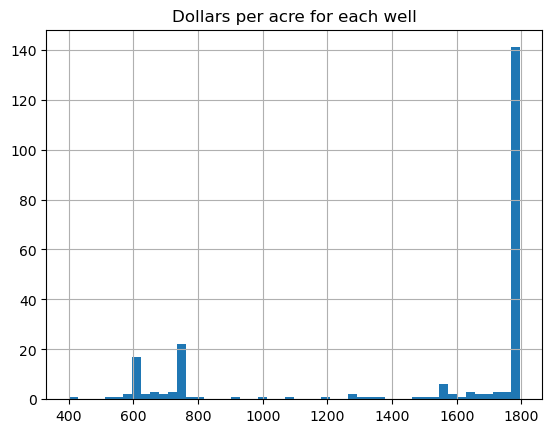

In [29]:
(receipts_summary.total_receipts/receipts_summary.acres_irrigated).hist(bins=50)
plt.title('Dollars per acre for each well')

In [30]:
# flip the index back to hi-cap well numbers to align with the yml file
receipts_summary = receipts_summary.merge(well_source_xref,left_index=True,right_on='site_no')

#### now, TL;DR, we have a lookup table with the index being well ID as used by `pycap`, and other columns being total irrigated acres supplied by that well and the total receipts. Important assumption here is that we will later assume that the amount of receipts would be achieved by the well pumping at its assumed rate. When we calculate receipts later, we will simply linearly increasde or decrease receipts by the same fraction that well pumping is increased or reduced. There is nuance beyond that but for this exercise, we will leave it here.

In [31]:
receipts_summary.to_csv(econ_path / 'total_receipts.csv')